## Punto 1

In [1]:
import numpy as np
import matplotlib.pyplot as plt
#plt.rcParams.update({'figure.max_open_warning': 0})
import cv2
import os, sys
from glob import glob as gl
import skimage.io as io
import matplotlib.gridspec as gridspec

In [2]:
path_images = gl(os.path.join(os.getcwd(),'colorful_ims/*.jpg'))

In [3]:
def read_img(name, gray= True):
    try:
        # read the image with openCv
        img = cv2.imread(name)
        # convert BGR to RGB order
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if gray:
            img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # print the type of data of image
        print("The type of data of the image is: ", type(img))
        # create a figure with 10x10
        plt.figure(figsize=(10,10))
        # show the image
        plt.imshow(img, cmap= 'gray')    
        return img
    except:
        raise NameError("The file {} doesn't exist".format(name))

The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>


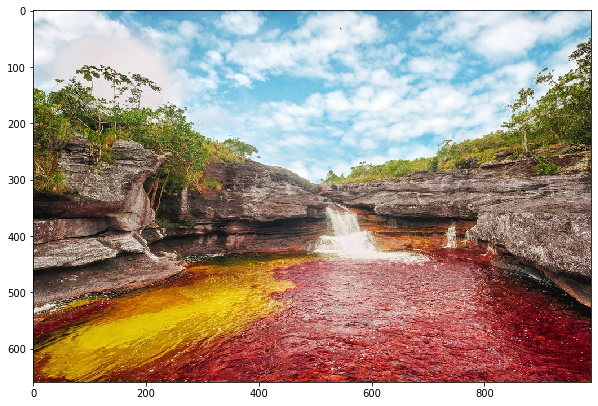

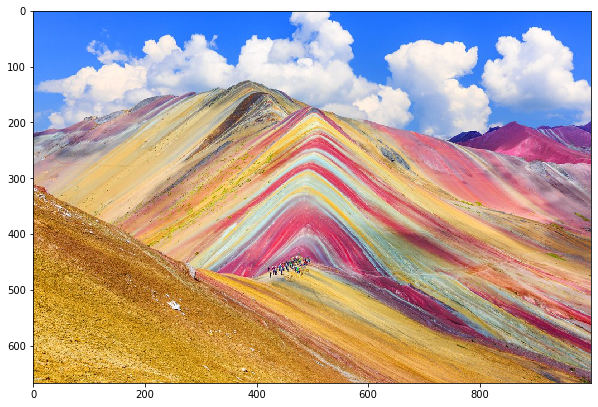

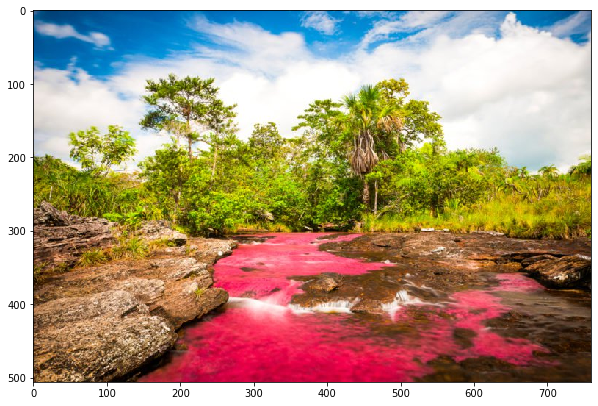

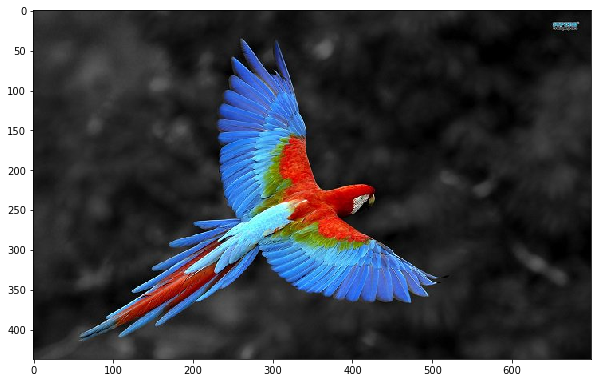

In [4]:
images = []
for img in path_images:
    images.append(read_img(img, False))

In [5]:
def MyModifyChannel_2016719749_201126292(image, dest_space, channel, value):
    global img
    img = np.copy(image)
    def modify(value,c,minimun, maximun):
        if value == '0':
            img[:,:,c] = minimun
        elif value== '1':
            img[:,:,c] = (minimun+maximun)/2
        else:
            img[:,:,c] = maximun
            
    if dest_space == 'hsv':
        c, minimun, maximun = (0,0,255) if channel=='h' else (1,0,255) if channel=='s' else (2,0,255)
        img = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
        modify(value,c,minimun, maximun)
        img = cv2.cvtColor(img,cv2.COLOR_HSV2RGB)
    
    elif dest_space == 'lab':
        c, minimun, maximun = (0,0,255) if channel=='l' else (1,1,255) if channel=='a' else (2,1,255)
        img = cv2.cvtColor(img,cv2.COLOR_RGB2LAB)
        modify(value,c,minimun, maximun)
        img = cv2.cvtColor(img,cv2.COLOR_LAB2RGB)
        
    else:
        c = 0 if channel=='r' else 1 if channel=='g' else 2
        minimun, maximun = 0,255
        modify(value,c,minimun, maximun)
    return img

c:\users\gabriela\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


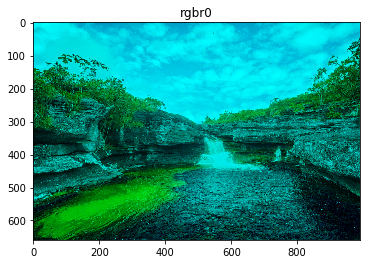

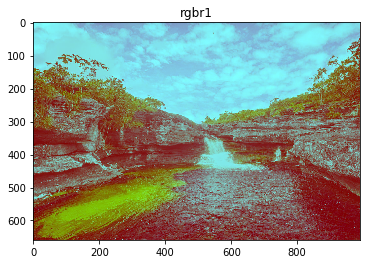

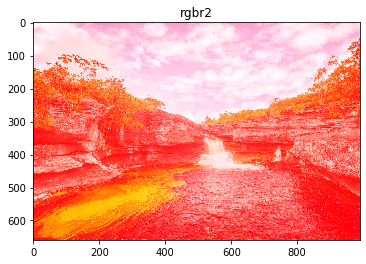

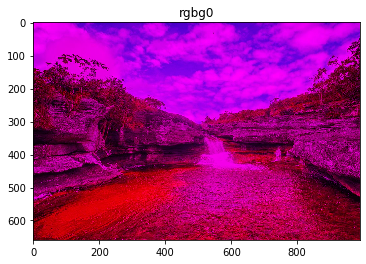

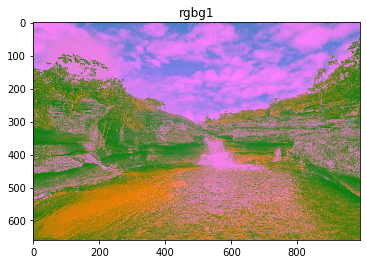

...

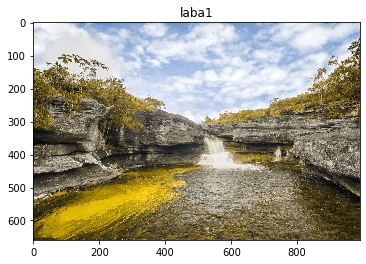

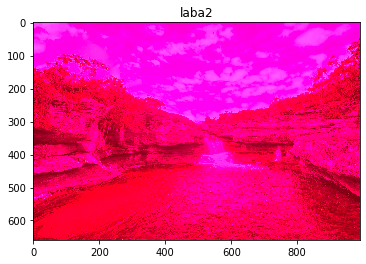

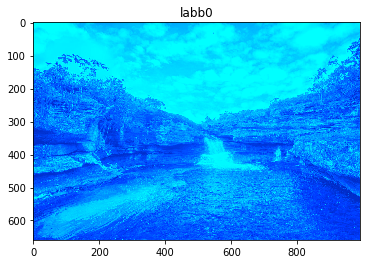

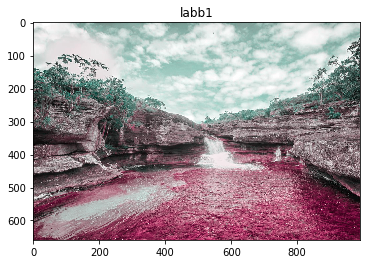

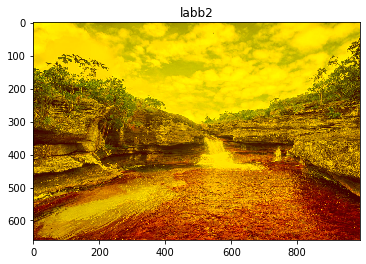

In [6]:
list_space = {'rgb' : ['r','g','b'],
              'hsv' : ['h','s','v'] ,
              'lab': ['l','a','b']}
img_cont = 0
for key in list_space.keys():
    for channel in list_space[key]:
        for value in range(3):
            img_temp = MyModifyChannel_2016719749_201126292(images[0], key,channel, str(value))
            plt.figure()
            plt.title(key+channel+str(value))
            plt.imshow(img_temp)

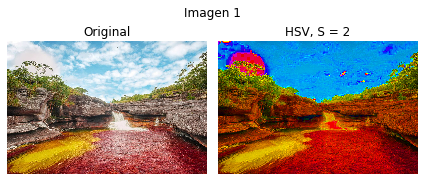

In [7]:
img1_good = MyModifyChannel_2016719749_201126292(images[0], 'hsv', 's', '2')
plt.figure()
plt.suptitle('Imagen 1', x = 0.5, y = 0.85)
plt.subplot(1,2,1)
plt.title('Original')
plt.imshow(images[0])
plt.axis('off')

plt.subplot(1,2,2)
plt.title('HSV, S = 2')
plt.imshow(img1_good)
plt.axis('off')

plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'Imagen1.png'))

Como se puede obervar en la figura anterior, para obtener la imagen de la derecha a partir de la imagen izquierda se cambio la base de color original (RGB) a el espacio HSV. Estando en este espacio se modificó el canal de saturación a su valor maximo, ya que esto permite saturar todos los colores contenidos en la imagen. No se encontró otra modificación que permitiera este resultado ya que HSV es el unico espacio que permite modificar la saturación de los colores. 

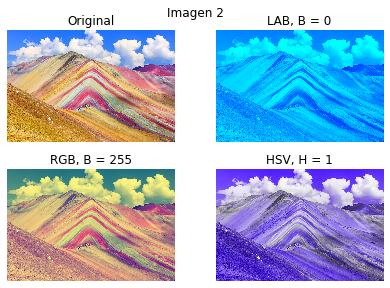

In [8]:
img2_good = MyModifyChannel_2016719749_201126292(images[1], 'lab', 'b', '0')
img3_wrong = MyModifyChannel_2016719749_201126292(images[1], 'rgb', 'b', '1')
img3_wrong1= MyModifyChannel_2016719749_201126292(images[1], 'hsv', 'h', '1')
plt.figure()
plt.suptitle('Imagen 2', x = 0.5, y = 0.99)
plt.subplot(2,2,1)
plt.title('Original')
plt.imshow(images[1])
plt.axis('off')

plt.subplot(2,2,2)
plt.title('LAB, B = 0')
plt.imshow(img2_good)
plt.axis('off')

plt.subplot(2,2,3)
plt.title('RGB, B = 255')
plt.imshow(img3_wrong)
plt.axis('off')

plt.subplot(2,2,4)
plt.title('HSV, H = 1')
plt.imshow(img3_wrong1)
plt.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'Imagen2.png'))

Para la modificacion de la imagen anterior, se optó por modificar al valor maximo todos los canales que correspondiesen al color azul. Sin embargo, la imagen exacta solicitada se obtuvo al pasar la imagen original al espacio de color LAB y configurar el canal B al valor minimo de dicho espacio.

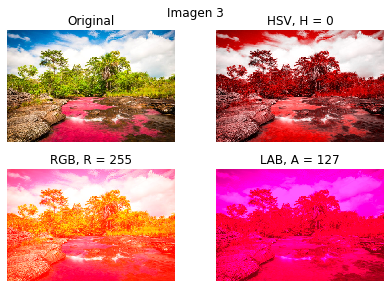

In [9]:
img3_good = MyModifyChannel_2016719749_201126292(images[2], 'hsv', 'h', '0')
img3_wrong = MyModifyChannel_2016719749_201126292(images[2], 'rgb', 'r', '2')
img3_wrong1 = MyModifyChannel_2016719749_201126292(images[2], 'lab', 'a', '2')
plt.figure()
plt.suptitle('Imagen 3', x = 0.5, y = 0.99)
plt.subplot(2,2,1)
plt.title('Original')
plt.imshow(images[2])
plt.axis('off')

plt.subplot(2,2,2)
plt.title('HSV, H = 0')
plt.imshow(img3_good)
plt.axis('off')

plt.subplot(2,2,3)
plt.title('RGB, R = 255')
plt.imshow(img3_wrong)
plt.axis('off')

plt.subplot(2,2,4)
plt.title('LAB, A = 127')
plt.imshow(img3_wrong1)
plt.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'Imagen3.png'))

De igual forma, para la modificacion de la imagen anterior, se optó por modificar al valor maximo todos los canales que correspondiesen al color rojo. Sin embargo, la imagen exacta solicitada se obtuvo al pasar la imagen original al espacio de color HSV y configurar el canal H al valor minimo de dicho espacio.


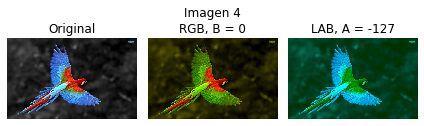

In [10]:
img4_good = MyModifyChannel_2016719749_201126292(images[3], 'rgb', 'b', '0')
img4_wrong = MyModifyChannel_2016719749_201126292(images[3], 'lab', 'a', '0')
plt.figure()
plt.suptitle('Imagen 4', x = 0.5, y = 0.75)
plt.subplot(1,3,1)
plt.title('Original')
plt.imshow(images[3])
plt.axis('off')

plt.subplot(1,3,2)
plt.title('RGB, B = 0')
plt.imshow(img4_good)
plt.axis('off')

plt.subplot(1,3,3)
plt.title('LAB, A = -127')
plt.imshow(img4_wrong)
plt.axis('off')

plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'Imagen4.png'))

En el caso de la imagen anterior, se esperaba obtener la imagen de la mitad apartir de la imagen izquierda. Para ello, se optó por modificar los canales de los espacion RGB y LAB correspondientes al color. El resultado esperado se obtuvo al eliminar la intensidad del canal azul, es decir, ajustando el canal B al valor de cero.

## Punto 2

In [11]:
path_images2 = gl(os.path.join(os.getcwd(),'images','train','*.png'))

The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>


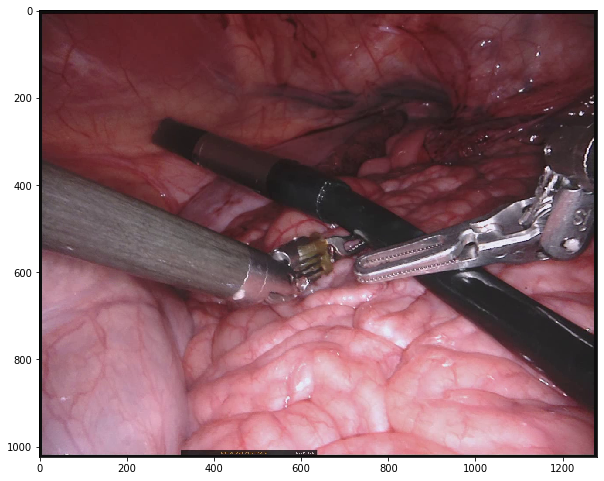

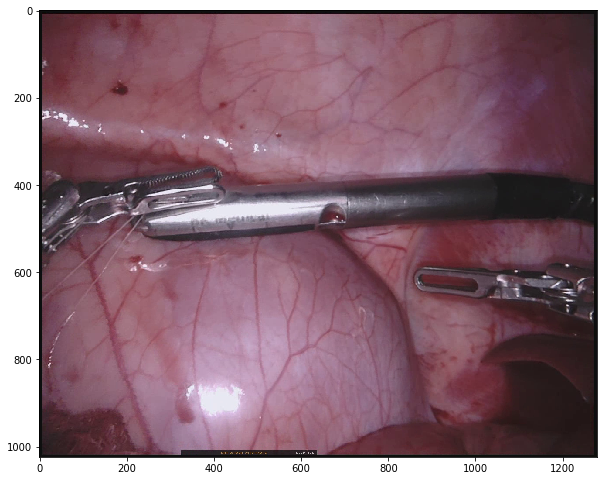

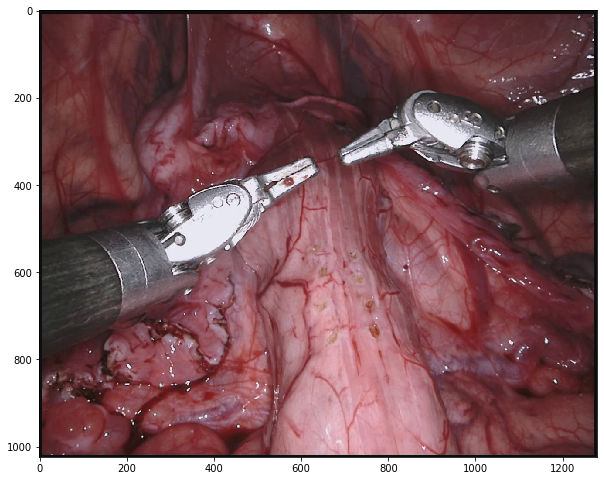

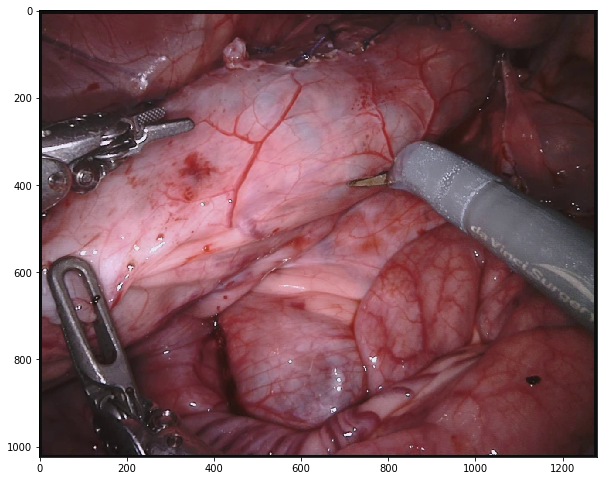

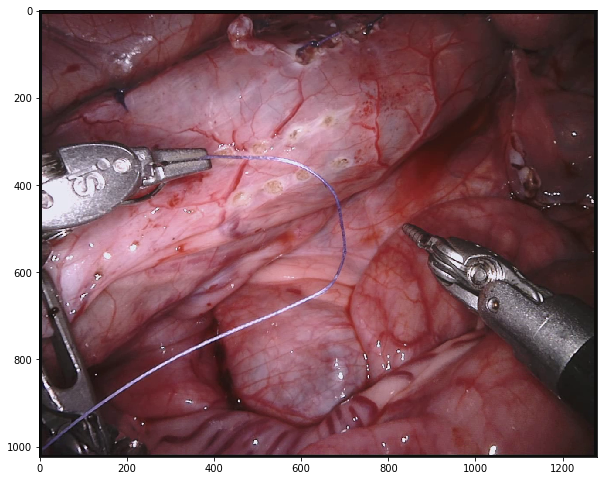

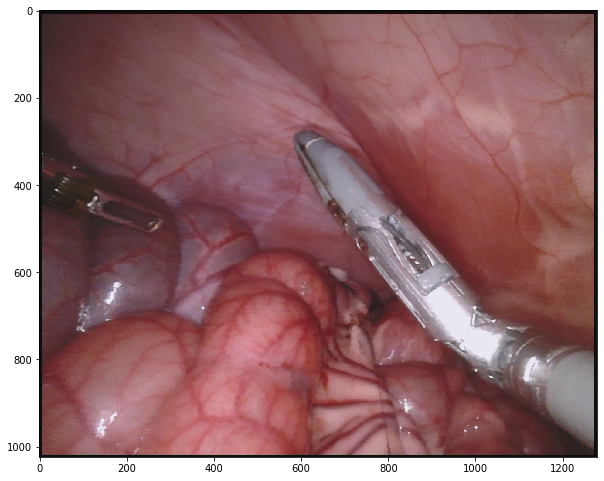

In [12]:
images2 = []
for img in path_images2:
    images2.append(read_img(img, False))

Con el objectivo de segmentar los instumentos quirúrjicos de las imagenes de validación mostradas en la figura #, se aplicó un algoritmo que consistió en los siguientes pasos:
Primero, se transformó la imagen del espacio RGB al espacio HSV. En este espacio se aplicó por una parte la umbralización a en los canales value (V) y saturation (S) con los valores de 105 y 180, respectivamente. Estó se realizó para obtener los marcadores con el objectivo de posteriormente realizar un apertura por reconstrucción morfologica. Segundo, se realizo una copia de la imagen en el espacio HSV antes de umbralizar para obtener la base donde se realizó la apertura geodesica. En esta copia se ajustaron los canales Hue y Value con los valores minimo y maximo para cada canal. Despúes se convirtió al espacio RGB de nuevo y allí se determinó el canal Red (R) a su valor minimo de cero. Esta imagen resultante se convitió a escala de grises y se ecualizó dicha imagen para aumentar el contraste. A seguir, se aplicó una umbralización de esta imagen con el valor de 180. A esta imagen resultante se le aplicó una erosión con un elemento estructurante cuadrado, el cual se utilizó en el resto de las operaciones morfologicas, para eliminar los objectos pequeños. A la iamgen erosionada se le aplicó la apertura por reconsturcción con la imagen de los marcadores obtenida en el primer paso. Antes de realizar la apertura por reconstrucción, se realizó una apertura a los marcadores para eliminar los objectos menores al elemento estructurante. Despues de obtener la apertura por reconstucción, esta se utilizó como marcador para realizar de nuevo otra apertura por reconstrucción con la imagen erosionada. El diagrama de flujo del algoritmo se explica graficamente en la siguiente imagen:

![img](./algoritmo.png)




In [13]:
def segment_instrument(img):
    #obteniendo marcadores
    hsv =  cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
    canalv = np.logical_and(hsv[:,:,2]<=105,hsv[:,:,1]<=80)
    canalv = canalv.astype(np.uint8)
    
    #obteniendo base de reconstuccion
    hsv[:,:,2] = 255
    hsv[:,:,0] = 0
    hsv_rgb =  cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
    hsv_rgb[:,:,0] = 0
    blur = cv2.GaussianBlur(hsv_rgb,(5,5),0)
    gray = cv2.cvtColor(blur, cv2.COLOR_RGB2GRAY)
    equ = cv2.equalizeHist(gray)   
    mask = equ>=180
    
    #erosion
    kernel = np.ones((5,5), np.uint8)
    mask = mask.astype(np.uint8)
    img_erosion = cv2.erode(mask, kernel, iterations=1)
    #apertura
    kernel_open = np.ones((5,5), np.uint8)
    opening = cv2.morphologyEx(canalv, cv2.MORPH_OPEN, kernel_open)
    
    #apertura por reconstruccion
    kernel2 = np.ones((20,150), np.uint8)
    end = True
    while end:
        temp = opening
        img_dilation = cv2.dilate(opening, kernel2, iterations=1) 
        inters = np.logical_and(img_dilation,img_erosion)
        if (temp == inters).all:
            end = False
            
    inters = inters.astype(np.uint8)      
    #apretura por reconstruccion 2
    kernel3 = np.ones((10,10), np.uint8)
    end = True
    while end:
        temp2 = inters
        inters_dilation = cv2.dilate(inters, kernel3, iterations=7) 
        inters2 = np.logical_and(inters_dilation,img_erosion)
        if (temp2 == inters2).all:
            end = False
    
    return inters2


## Testeando codigo en entrenamiento

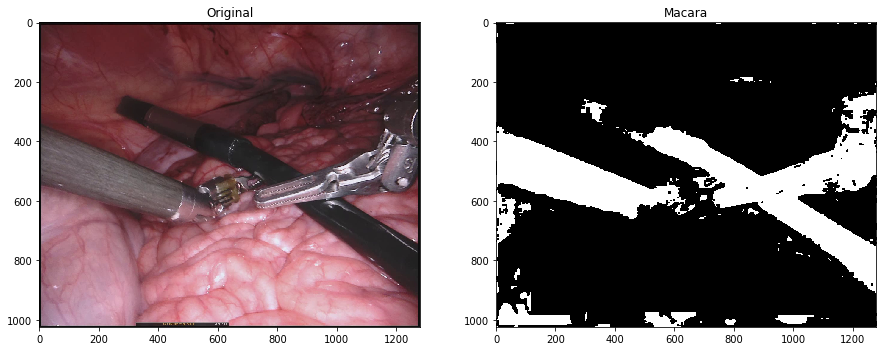

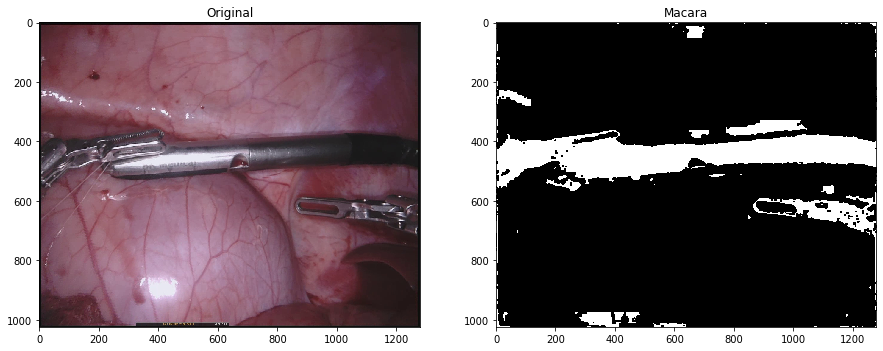

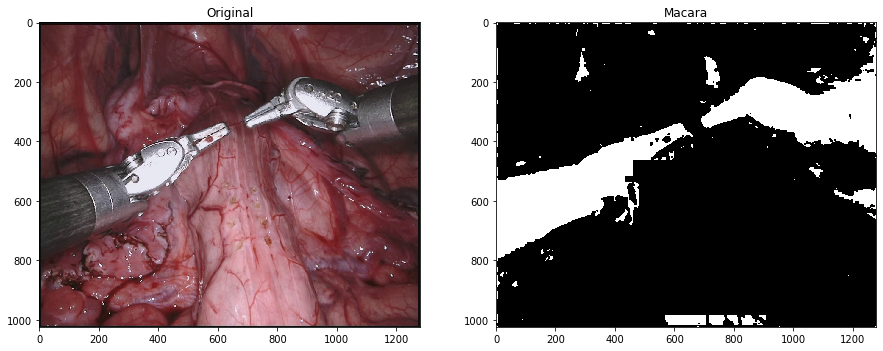

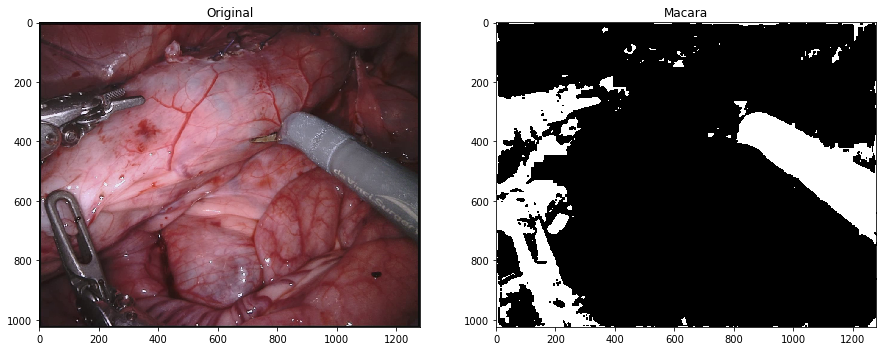

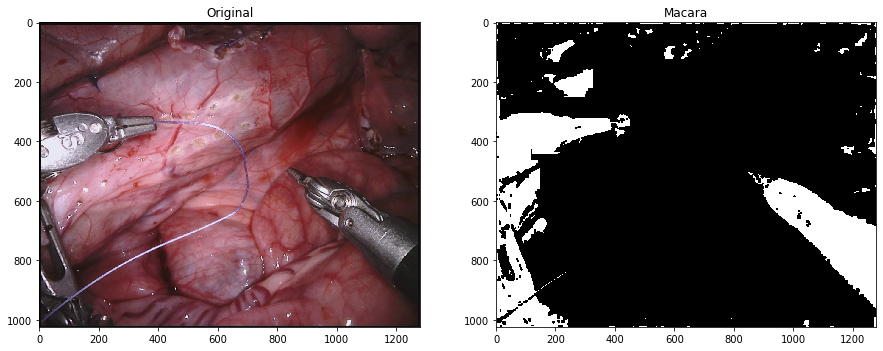

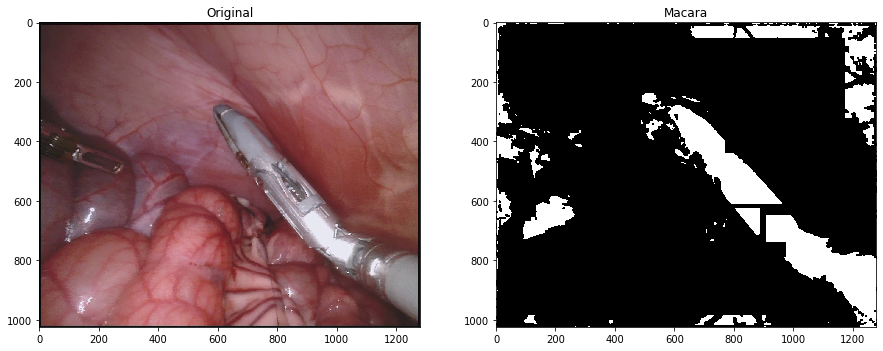

In [14]:
masks = []
for imagen in images2:
    masks.append(segment_instrument(imagen))
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.imshow(imagen)
    plt.title('Original')
    plt.subplot(1,2,2)
    plt.imshow(segment_instrument(imagen),cmap = 'gray')
    plt.title('Macara')

## Testeando codigo en validación

In [15]:
path_images_val = gl(os.path.join(os.getcwd(),'images','val','*.png'))

The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>
The type of data of the image is:  <class 'numpy.ndarray'>


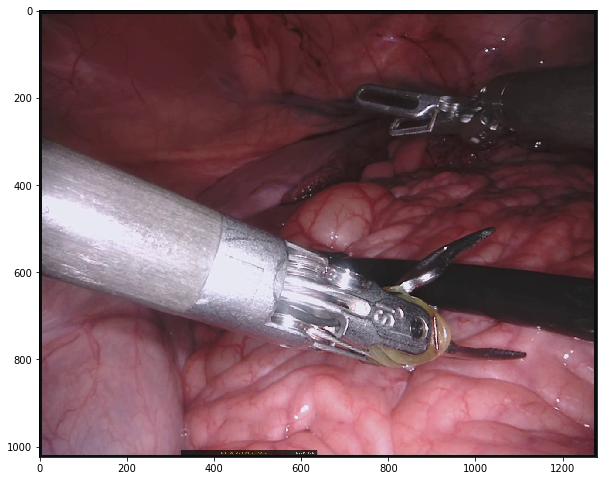

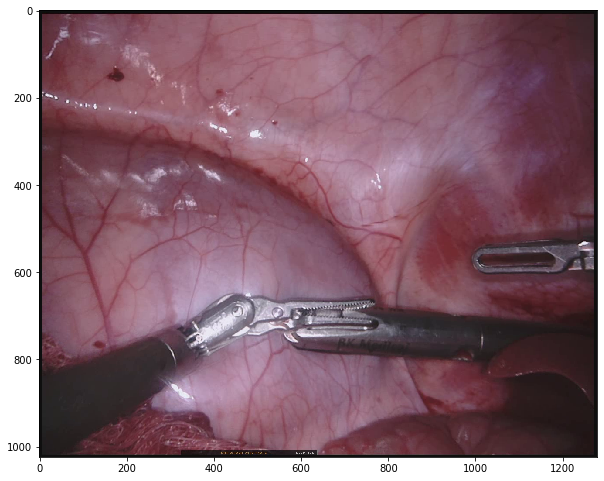

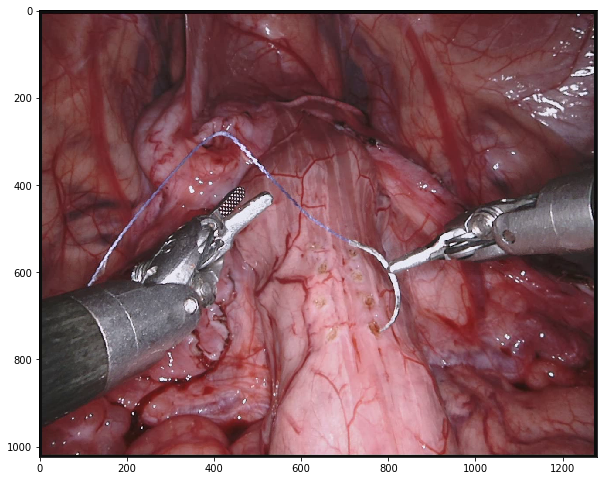

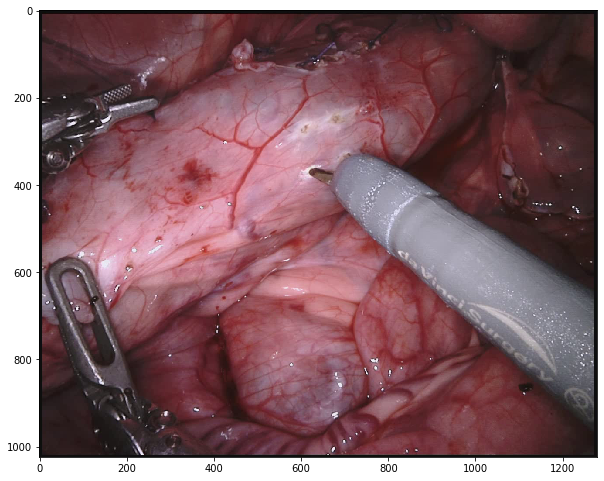

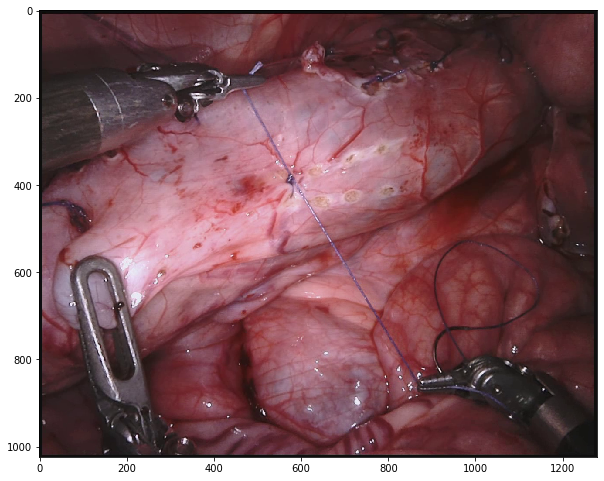

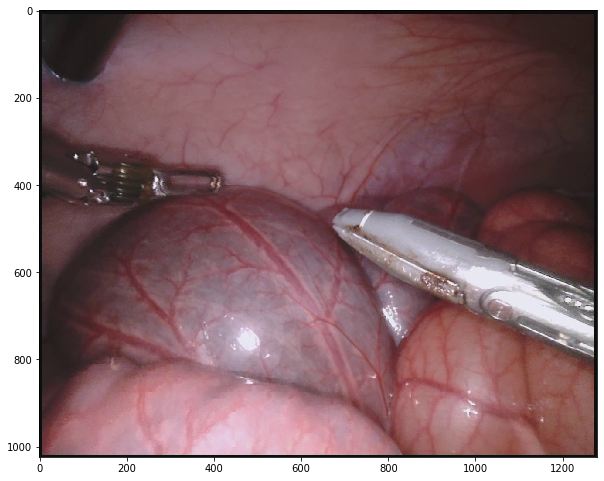

In [16]:
images_val = []
for img in path_images_val:
    images_val.append(read_img(img, False))

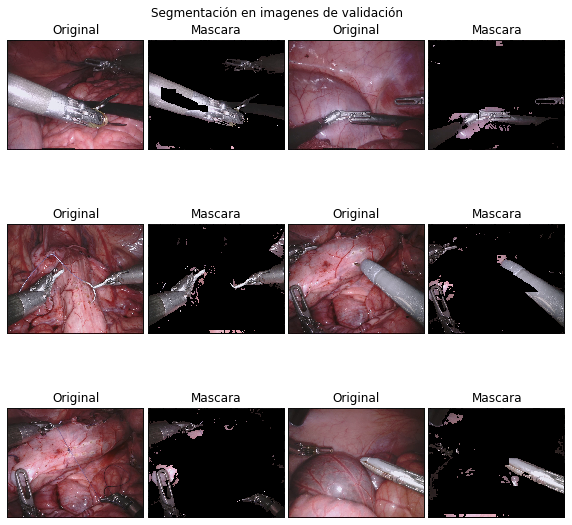

In [17]:
masks_val = []
cont_or=0
cont_sg=1
plt.figure(figsize=(10,10))
plt.suptitle('Segmentación en imagenes de validación', x=0.5,y=0.88)
gs1 = gridspec.GridSpec(3, 4)
gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes.
for imagen in images_val:
    
    ax1 = plt.subplot(gs1[cont_or])
    ax1.imshow(imagen)
    plt.title('Original')
    plt.axis('off')
    cont_or +=2
    #plt.axis('on')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
    
    masks_val.append(segment_instrument(imagen))
    #plt.figure(figsize=(8,8))
    ax2 = plt.subplot(gs1[cont_sg])
    mask = segment_instrument(imagen).astype(np.uint8)
    imgen_seg = cv2.bitwise_and(imagen,imagen,mask = mask)
    ax2.imshow(imgen_seg,cmap = 'gray')
    plt.title('Mascara')
    plt.axis('off')
    ax2.set_xticklabels([])
    ax2.set_yticklabels([])
    ax2.set_aspect('equal')
    cont_sg +=2
#plt.tight_layout()
plt.savefig(os.path.join(os.getcwd(),'Validation_seg.png'))



In [18]:
# creatinf folders
current_directory = os.getcwd()
if not os.path.exists(os.path.join(current_directory,'predictions')):
    path = os.path.join(current_directory,'predictions')
    os.mkdir(path)
    pp_val = os.path.join(current_directory,'predictions','val')
    os.makedirs(pp_val)
    pp_train = os.path.join(current_directory,'predictions','train')
    os.makedirs(pp_train)

In [19]:
#saving validation images segmented
path = os.path.join(current_directory,'predictions')
for i in range(len(path_images_val)):
    name = path_images_val[i][-17:]
    path_save = os.path.join(path,'val',name)
    imagen_val_save= masks_val[i].astype(np.uint8)
    io.imsave(path_save,imagen_val_save)

c:\users\gabriela\appdata\local\programs\python\python36\lib\site-packages\skimage\io\_io.py:141: UserWarning: C:\Users\GABRIELA\Documents\ProcesamientoImagenes\Laboratorio6_Color\predictions\val\seq1_frame039.png is a low contrast image
  warn('%s is a low contrast image' % fname)
c:\users\gabriela\appdata\local\programs\python\python36\lib\site-packages\skimage\io\_io.py:141: UserWarning: C:\Users\GABRIELA\Documents\ProcesamientoImagenes\Laboratorio6_Color\predictions\val\seq2_frame082.png is a low contrast image
  warn('%s is a low contrast image' % fname)
c:\users\gabriela\appdata\local\programs\python\python36\lib\site-packages\skimage\io\_io.py:141: UserWarning: C:\Users\GABRIELA\Documents\ProcesamientoImagenes\Laboratorio6_Color\predictions\val\seq3_frame004.png is a low contrast image
  warn('%s is a low contrast image' % fname)
c:\users\gabriela\appdata\local\programs\python\python36\lib\site-packages\skimage\io\_io.py:141: UserWarning: C:\Users\GABRIELA\Documents\Procesamient

In [20]:
# %load ./datos_Lab6/evaluation.py
import os
import os.path as osp
import skimage.io as io
import numpy as np
import pdb

def evaluation(ann_folder, pred_folder):
    # Function that performs the evaluation of predictions given
    # the path to a folder with annotations and the path to the folder
    # with the predictions.
    # Args:
    #   ann_folder: path to folder with annotations.
    #   pred_folder: path to folder with predictions.
    # Returns:
    #   aiou and miou
    # To use in another python script import as:
    #   from evaluation import evaluation
    ann_names = os.listdir(ann_folder)
    def compute_mask_IU(mask, target):
        assert target.shape[-2:] == mask.shape[-2:]
        temp = mask * target
        intersection = temp.sum()
        union = ((mask + target) - temp).sum()
        return intersection, union

    jaccards = []
    inters = 0
    unions = 0
    for name in ann_names:
        # get names of ann and pred
        ann_name = osp.join(ann_folder, name)
        pred_name = osp.join(pred_folder, name)
        # read ann and pred
        this_ann = io.imread(ann_name)
        this_pred = io.imread(pred_name)
        # remove from ann instance information and convert to float64
        this_ann = (this_ann > 0).astype('float64')
        # make sure pred is binary
        this_pred = (this_pred > 0).astype('float64')
        # conpute intersection and union between ann and pred
        inter, union = compute_mask_IU(this_ann, this_pred)
        jaccards.append(inter/union)
        
        inters += inter
        unions += union
    # calculate metrics
    aiou = np.mean(np.asarray(jaccards))
    miou = inters/unions
    return aiou, miou

In [21]:
ann_folder = os.path.join(current_directory,'annotations','val')
pred_folder = os.path.join(current_directory,'competitor_predictions','val')

aiou_comp, miou_comp = evaluation(ann_folder, pred_folder)
print('El aiou del competidor fue',aiou_comp)
print('El miou del competidor fue',miou_comp)

El aiou del competidor fue 0.5264421792719345
El miou del competidor fue 0.5484165018668478


In [22]:
ann_folder_my = os.path.join(current_directory,'annotations','val')
pred_folder_my = os.path.join(current_directory,'predictions','val')

my_aiou, my_miou = evaluation(ann_folder_my, pred_folder_my)
print('El aiou de nosotros fue',my_aiou)
print('El miou de nosotros fue',my_miou)

El aiou de nosotros fue 0.5837297303546226
El miou de nosotros fue 0.5973542327063852


## comparando metodos

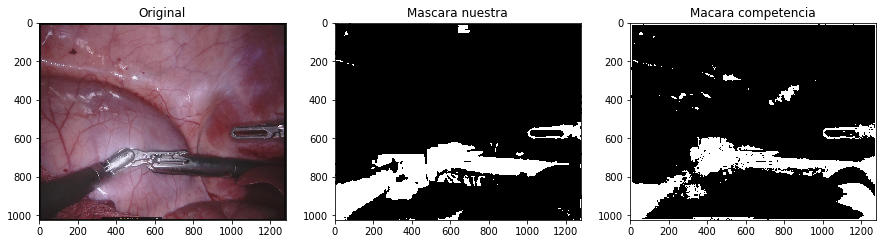

In [29]:
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.imshow(images_val[1])
plt.title('Original')
plt.subplot(1,3,2)
plt.imshow(plt.imread('predictions/val/seq2_frame082.png'),cmap = 'gray')
plt.title('Mascara nuestra')
plt.subplot(1,3,3)
plt.imshow(plt.imread('./competitor_predictions/val/seq2_frame082.png'),cmap = 'gray')
plt.title('Macara competencia')
plt.savefig(os.path.join(os.getcwd(),'comparision.png'))